# Import libraries

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
!pip install git+https://github.com/albumentations-team/albumentations.git
!pip install torchsummary

  Cloning https://github.com/albumentations-team/albumentations.git to /tmp/pip-req-build-0vhxn6yt
  Running command git clone -q https://github.com/albumentations-team/albumentations.git /tmp/pip-req-build-0vhxn6yt
  Created wheel for albumentations: filename=albumentations-1.0.0-cp37-none-any.whl size=98531 sha256=b27af1193d8de84e9d7b4331d85c5b136e8036f9bbbafd3e5bc098d142f873d7
  Stored in directory: /tmp/pip-ephem-wheel-cache-63eb0eq4/wheels/e2/85/3e/2a40fac5cc1f43ced656603bb2fca1327b30ec7de1b1b66517
Successfully built albumentations


In [5]:
!git clone https://github.com/gkdivya/torch_cv_wrapper.git

Cloning into 'torch_cv_wrapper'...
remote: Enumerating objects: 252, done.
remote: Counting objects: 100% (252/252), done.
remote: Compressing objects: 100% (242/242), done.
remote: Total 252 (delta 145), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (252/252), 59.99 KiB | 6.00 MiB/s, done.
Resolving deltas: 100% (145/145), done.


In [6]:
from __future__ import print_function
import torchvision
import torch
from pprint import pprint
# Let's visualize some of the images
%matplotlib inline
import matplotlib.pyplot as plt

## Import Custom Libraries
from torch_cv_wrapper.utils import plot_metrics,train,test,helper
from torch_cv_wrapper.utils.gradcam import generate_gradcam, plot_gradcam
from torch_cv_wrapper.model import resnet
from torch_cv_wrapper.main import TriggerEngine

## Load config file

In [7]:
config = helper.process_config("/content/drive/MyDrive/Cifar10_Resnet/session8_assignment/Cifar10_with_resnet18_LN_OneCycleLR.yaml")
use_cuda = torch.cuda.is_available()
helper.set_seed(config['model_params']['seed'],use_cuda)
device = torch.device("cuda" if use_cuda else "cpu")
pprint(config)

 loading Configuration of your experiment ..
{'criterion': 'CrossEntropyLoss',
 'data_augmentation': {'type': 'CIFAR10Albumentation'},
 'data_loader': {'args': {'batch_size': 256,
                          'num_workers': 2,
                          'pin_memory': True},
                 'classes': ['plane',
                             'car',
                             'bird',
                             'cat',
                             'deer',
                             'dog',
                             'frog',
                             'horse',
                             'ship',
                             'truck'],
                 'type': 'Cifar10DataLoader'},
 'lr_scheduler': 'OneCycleLR',
 'model': 'Resnet18',
 'model_params': {'dropout': 0.05,
                  'experiment_name': 'Cifar10_with_resnet18_LN_OneCycleLR',
                  'model_dir': './model/',
                  'seed': 1},
 'optimizer': {'args': {'lr': 0.001}, 'type': 'optim.Adam'},
 'training_pa

## Create Training Instance

In [8]:
exp_metrics={}
experiment_name=config['model_params']['experiment_name']
trigger_training=TriggerEngine(config)

## Download data and view sample images

In [9]:
classes= config['data_loader']['classes']

#Get dataloaders
train_loader,test_loader = trigger_training.dataloader()


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


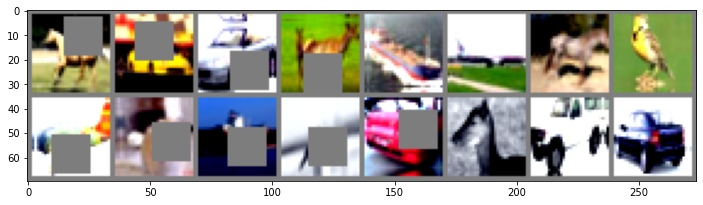

In [11]:
# get some random training images
images, labels = iter(train_loader).next()

# # show images
helper.imshow(torchvision.utils.make_grid(images[:16]))

## Model Summary

In [12]:
model = resnet.ResNet18("LN")
model.to(device)
trigger_training.model_summary(model,(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
         GroupNorm-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
         GroupNorm-4           [-1, 64, 32, 32]             128
            Conv2d-5           [-1, 64, 32, 32]          36,864
         GroupNorm-6           [-1, 64, 32, 32]             128
        BasicBlock-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
         GroupNorm-9           [-1, 64, 32, 32]             128
           Conv2d-10           [-1, 64, 32, 32]          36,864
        GroupNorm-11           [-1, 64, 32, 32]             128
       BasicBlock-12           [-1, 64, 32, 32]               0
           Conv2d-13          [-1, 128, 32, 32]          73,728
        GroupNorm-14          [-1, 128,

## Trigger training

In [14]:
# trigger_training.
(exp_metrics[experiment_name]) = trigger_training.run_experiment(model,train_loader,test_loader)
#trigger_training.save_experiment(model,experiment_name,"/content/drive/MyDrive/Cifar10_Resnet/saved_models")


  0%|          | 0/196 [00:00<?, ?it/s]

using OneCycleLR
Epoch 1:



Loss=2.290069103240967 Batch_id=0 LR=0.00004 Accuracy=15.23:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=2.290069103240967 Batch_id=0 LR=0.00004 Accuracy=15.23:   1%|          | 1/196 [00:00<02:44,  1.19it/s]
Loss=2.3711278438568115 Batch_id=1 LR=0.00004 Accuracy=13.87:   1%|          | 1/196 [00:01<02:44,  1.19it/s]
Loss=2.3711278438568115 Batch_id=1 LR=0.00004 Accuracy=13.87:   1%|          | 2/196 [00:01<02:29,  1.30it/s]
Loss=2.312429189682007 Batch_id=2 LR=0.00004 Accuracy=13.28:   1%|          | 2/196 [00:02<02:29,  1.30it/s] 
Loss=2.312429189682007 Batch_id=2 LR=0.00004 Accuracy=13.28:   2%|▏         | 3/196 [00:02<02:18,  1.39it/s]
Loss=2.2730391025543213 Batch_id=3 LR=0.00004 Accuracy=13.57:   2%|▏         | 3/196 [00:02<02:18,  1.39it/s]
Loss=2.2730391025543213 Batch_id=3 LR=0.00004 Accuracy=13.57:   2%|▏         | 4/196 [00:02<02:11,  1.46it/s]
Loss=2.2660601139068604 Batch_id=4 LR=0.00004 Accuracy=14.06:   2%|▏         | 4/196 [00:03<02:11,  1.46it/s]
Loss=2.2660601139068


Test set: Average loss: 0.0065, Accuracy: 4075/10000 (40.75%)

Epoch 2:



Loss=1.7200274467468262 Batch_id=0 LR=0.00006 Accuracy=40.23:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=1.7200274467468262 Batch_id=0 LR=0.00006 Accuracy=40.23:   1%|          | 1/196 [00:00<02:42,  1.20it/s]
Loss=1.7061501741409302 Batch_id=1 LR=0.00006 Accuracy=39.26:   1%|          | 1/196 [00:01<02:42,  1.20it/s]
Loss=1.7061501741409302 Batch_id=1 LR=0.00006 Accuracy=39.26:   1%|          | 2/196 [00:01<02:33,  1.27it/s]
Loss=1.7066694498062134 Batch_id=2 LR=0.00006 Accuracy=38.02:   1%|          | 2/196 [00:02<02:33,  1.27it/s]
Loss=1.7066694498062134 Batch_id=2 LR=0.00006 Accuracy=38.02:   2%|▏         | 3/196 [00:02<02:24,  1.34it/s]
Loss=1.776910662651062 Batch_id=3 LR=0.00006 Accuracy=37.30:   2%|▏         | 3/196 [00:02<02:24,  1.34it/s] 
Loss=1.776910662651062 Batch_id=3 LR=0.00006 Accuracy=37.30:   2%|▏         | 4/196 [00:02<02:18,  1.39it/s]
Loss=1.776619553565979 Batch_id=4 LR=0.00006 Accuracy=37.81:   2%|▏         | 4/196 [00:03<02:18,  1.39it/s]
Loss=1.776619553565


Test set: Average loss: 0.0061, Accuracy: 4465/10000 (44.65%)

Epoch 3:



Loss=1.5720998048782349 Batch_id=0 LR=0.00010 Accuracy=44.92:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=1.5720998048782349 Batch_id=0 LR=0.00010 Accuracy=44.92:   1%|          | 1/196 [00:00<02:48,  1.15it/s]
Loss=1.5475668907165527 Batch_id=1 LR=0.00011 Accuracy=45.12:   1%|          | 1/196 [00:01<02:48,  1.15it/s]
Loss=1.5475668907165527 Batch_id=1 LR=0.00011 Accuracy=45.12:   1%|          | 2/196 [00:01<02:38,  1.22it/s]
Loss=1.6014633178710938 Batch_id=2 LR=0.00011 Accuracy=43.62:   1%|          | 2/196 [00:02<02:38,  1.22it/s]
Loss=1.6014633178710938 Batch_id=2 LR=0.00011 Accuracy=43.62:   2%|▏         | 3/196 [00:02<02:31,  1.27it/s]
Loss=1.7215663194656372 Batch_id=3 LR=0.00011 Accuracy=42.48:   2%|▏         | 3/196 [00:02<02:31,  1.27it/s]
Loss=1.7215663194656372 Batch_id=3 LR=0.00011 Accuracy=42.48:   2%|▏         | 4/196 [00:02<02:24,  1.33it/s]
Loss=1.5739190578460693 Batch_id=4 LR=0.00011 Accuracy=42.73:   2%|▏         | 4/196 [00:03<02:24,  1.33it/s]
Loss=1.5739190578


Test set: Average loss: 0.0053, Accuracy: 5159/10000 (51.59%)

Epoch 4:



Loss=1.4875385761260986 Batch_id=0 LR=0.00018 Accuracy=45.70:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=1.4875385761260986 Batch_id=0 LR=0.00018 Accuracy=45.70:   1%|          | 1/196 [00:00<02:48,  1.15it/s]
Loss=1.442408800125122 Batch_id=1 LR=0.00018 Accuracy=46.68:   1%|          | 1/196 [00:01<02:48,  1.15it/s] 
Loss=1.442408800125122 Batch_id=1 LR=0.00018 Accuracy=46.68:   1%|          | 2/196 [00:01<02:38,  1.22it/s]
Loss=1.5203453302383423 Batch_id=2 LR=0.00018 Accuracy=46.22:   1%|          | 2/196 [00:02<02:38,  1.22it/s]
Loss=1.5203453302383423 Batch_id=2 LR=0.00018 Accuracy=46.22:   2%|▏         | 3/196 [00:02<02:30,  1.28it/s]
Loss=1.4145280122756958 Batch_id=3 LR=0.00018 Accuracy=46.68:   2%|▏         | 3/196 [00:02<02:30,  1.28it/s]
Loss=1.4145280122756958 Batch_id=3 LR=0.00018 Accuracy=46.68:   2%|▏         | 4/196 [00:02<02:25,  1.32it/s]
Loss=1.3923580646514893 Batch_id=4 LR=0.00018 Accuracy=47.42:   2%|▏         | 4/196 [00:03<02:25,  1.32it/s]
Loss=1.39235806465


Test set: Average loss: 0.0051, Accuracy: 5274/10000 (52.74%)

Epoch 5:



Loss=1.490755558013916 Batch_id=0 LR=0.00028 Accuracy=44.14:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=1.490755558013916 Batch_id=0 LR=0.00028 Accuracy=44.14:   1%|          | 1/196 [00:00<02:46,  1.17it/s]
Loss=1.2479501962661743 Batch_id=1 LR=0.00028 Accuracy=48.63:   1%|          | 1/196 [00:01<02:46,  1.17it/s]
Loss=1.2479501962661743 Batch_id=1 LR=0.00028 Accuracy=48.63:   1%|          | 2/196 [00:01<02:36,  1.24it/s]
Loss=1.301893711090088 Batch_id=2 LR=0.00028 Accuracy=50.26:   1%|          | 2/196 [00:02<02:36,  1.24it/s] 
Loss=1.301893711090088 Batch_id=2 LR=0.00028 Accuracy=50.26:   2%|▏         | 3/196 [00:02<02:29,  1.29it/s]
Loss=1.4285420179367065 Batch_id=3 LR=0.00028 Accuracy=50.59:   2%|▏         | 3/196 [00:02<02:29,  1.29it/s]
Loss=1.4285420179367065 Batch_id=3 LR=0.00028 Accuracy=50.59:   2%|▏         | 4/196 [00:02<02:22,  1.35it/s]
Loss=1.311636209487915 Batch_id=4 LR=0.00028 Accuracy=51.02:   2%|▏         | 4/196 [00:03<02:22,  1.35it/s] 
Loss=1.3116362094879


Test set: Average loss: 0.0050, Accuracy: 5413/10000 (54.13%)

Epoch 6:



Loss=1.3688362836837769 Batch_id=0 LR=0.00040 Accuracy=49.61:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=1.3688362836837769 Batch_id=0 LR=0.00040 Accuracy=49.61:   1%|          | 1/196 [00:00<02:44,  1.19it/s]
Loss=1.367531418800354 Batch_id=1 LR=0.00040 Accuracy=50.39:   1%|          | 1/196 [00:01<02:44,  1.19it/s] 
Loss=1.367531418800354 Batch_id=1 LR=0.00040 Accuracy=50.39:   1%|          | 2/196 [00:01<02:34,  1.25it/s]
Loss=1.2760356664657593 Batch_id=2 LR=0.00040 Accuracy=50.26:   1%|          | 2/196 [00:02<02:34,  1.25it/s]
Loss=1.2760356664657593 Batch_id=2 LR=0.00040 Accuracy=50.26:   2%|▏         | 3/196 [00:02<02:28,  1.30it/s]
Loss=1.192415714263916 Batch_id=3 LR=0.00040 Accuracy=51.46:   2%|▏         | 3/196 [00:02<02:28,  1.30it/s] 
Loss=1.192415714263916 Batch_id=3 LR=0.00040 Accuracy=51.46:   2%|▏         | 4/196 [00:02<02:22,  1.35it/s]
Loss=1.3354144096374512 Batch_id=4 LR=0.00040 Accuracy=51.33:   2%|▏         | 4/196 [00:03<02:22,  1.35it/s]
Loss=1.335414409637


Test set: Average loss: 0.0049, Accuracy: 5780/10000 (57.80%)

Epoch 7:



Loss=1.375653624534607 Batch_id=0 LR=0.00052 Accuracy=50.39:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=1.375653624534607 Batch_id=0 LR=0.00052 Accuracy=50.39:   1%|          | 1/196 [00:00<02:49,  1.15it/s]
Loss=1.25465726852417 Batch_id=1 LR=0.00052 Accuracy=52.15:   1%|          | 1/196 [00:01<02:49,  1.15it/s] 
Loss=1.25465726852417 Batch_id=1 LR=0.00052 Accuracy=52.15:   1%|          | 2/196 [00:01<02:38,  1.23it/s]
Loss=1.4866448640823364 Batch_id=2 LR=0.00052 Accuracy=51.56:   1%|          | 2/196 [00:02<02:38,  1.23it/s]
Loss=1.4866448640823364 Batch_id=2 LR=0.00052 Accuracy=51.56:   2%|▏         | 3/196 [00:02<02:31,  1.28it/s]
Loss=1.44167959690094 Batch_id=3 LR=0.00052 Accuracy=50.39:   2%|▏         | 3/196 [00:02<02:31,  1.28it/s]  
Loss=1.44167959690094 Batch_id=3 LR=0.00052 Accuracy=50.39:   2%|▏         | 4/196 [00:02<02:24,  1.33it/s]
Loss=1.3095502853393555 Batch_id=4 LR=0.00052 Accuracy=51.09:   2%|▏         | 4/196 [00:03<02:24,  1.33it/s]
Loss=1.3095502853393555 


Test set: Average loss: 0.0039, Accuracy: 6473/10000 (64.73%)

Epoch 8:



Loss=1.282491683959961 Batch_id=0 LR=0.00065 Accuracy=52.73:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=1.282491683959961 Batch_id=0 LR=0.00065 Accuracy=52.73:   1%|          | 1/196 [00:00<02:46,  1.17it/s]
Loss=1.021685004234314 Batch_id=1 LR=0.00065 Accuracy=58.20:   1%|          | 1/196 [00:01<02:46,  1.17it/s]
Loss=1.021685004234314 Batch_id=1 LR=0.00065 Accuracy=58.20:   1%|          | 2/196 [00:01<02:37,  1.23it/s]
Loss=1.1884838342666626 Batch_id=2 LR=0.00065 Accuracy=58.07:   1%|          | 2/196 [00:02<02:37,  1.23it/s]
Loss=1.1884838342666626 Batch_id=2 LR=0.00065 Accuracy=58.07:   2%|▏         | 3/196 [00:02<02:29,  1.29it/s]
Loss=1.2315548658370972 Batch_id=3 LR=0.00065 Accuracy=56.74:   2%|▏         | 3/196 [00:02<02:29,  1.29it/s]
Loss=1.2315548658370972 Batch_id=3 LR=0.00065 Accuracy=56.74:   2%|▏         | 4/196 [00:02<02:23,  1.34it/s]
Loss=1.3424450159072876 Batch_id=4 LR=0.00065 Accuracy=55.47:   2%|▏         | 4/196 [00:03<02:23,  1.34it/s]
Loss=1.34244501590728


Test set: Average loss: 0.0046, Accuracy: 5896/10000 (58.96%)

Epoch 9:



Loss=1.2852718830108643 Batch_id=0 LR=0.00076 Accuracy=53.52:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=1.2852718830108643 Batch_id=0 LR=0.00076 Accuracy=53.52:   1%|          | 1/196 [00:00<02:46,  1.17it/s]
Loss=1.169832706451416 Batch_id=1 LR=0.00076 Accuracy=54.69:   1%|          | 1/196 [00:01<02:46,  1.17it/s] 
Loss=1.169832706451416 Batch_id=1 LR=0.00076 Accuracy=54.69:   1%|          | 2/196 [00:01<02:37,  1.23it/s]
Loss=1.2177866697311401 Batch_id=2 LR=0.00076 Accuracy=55.60:   1%|          | 2/196 [00:02<02:37,  1.23it/s]
Loss=1.2177866697311401 Batch_id=2 LR=0.00076 Accuracy=55.60:   2%|▏         | 3/196 [00:02<02:29,  1.29it/s]
Loss=1.07758629322052 Batch_id=3 LR=0.00076 Accuracy=58.30:   2%|▏         | 3/196 [00:02<02:29,  1.29it/s]  
Loss=1.07758629322052 Batch_id=3 LR=0.00076 Accuracy=58.30:   2%|▏         | 4/196 [00:02<02:24,  1.33it/s]
Loss=1.2902648448944092 Batch_id=4 LR=0.00076 Accuracy=57.42:   2%|▏         | 4/196 [00:03<02:24,  1.33it/s]
Loss=1.2902648448944


Test set: Average loss: 0.0037, Accuracy: 6592/10000 (65.92%)

Epoch 10:



Loss=1.0554580688476562 Batch_id=0 LR=0.00086 Accuracy=60.55:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=1.0554580688476562 Batch_id=0 LR=0.00086 Accuracy=60.55:   1%|          | 1/196 [00:00<02:46,  1.17it/s]
Loss=0.918377697467804 Batch_id=1 LR=0.00086 Accuracy=64.26:   1%|          | 1/196 [00:01<02:46,  1.17it/s] 
Loss=0.918377697467804 Batch_id=1 LR=0.00086 Accuracy=64.26:   1%|          | 2/196 [00:01<02:37,  1.24it/s]
Loss=0.9664809703826904 Batch_id=2 LR=0.00086 Accuracy=64.58:   1%|          | 2/196 [00:02<02:37,  1.24it/s]
Loss=0.9664809703826904 Batch_id=2 LR=0.00086 Accuracy=64.58:   2%|▏         | 3/196 [00:02<02:29,  1.29it/s]
Loss=1.1343034505844116 Batch_id=3 LR=0.00086 Accuracy=62.89:   2%|▏         | 3/196 [00:02<02:29,  1.29it/s]
Loss=1.1343034505844116 Batch_id=3 LR=0.00086 Accuracy=62.89:   2%|▏         | 4/196 [00:02<02:22,  1.35it/s]
Loss=1.1041570901870728 Batch_id=4 LR=0.00086 Accuracy=62.73:   2%|▏         | 4/196 [00:03<02:22,  1.35it/s]
Loss=1.10415709018


Test set: Average loss: 0.0035, Accuracy: 6899/10000 (68.99%)

Epoch 11:



Loss=0.9910683631896973 Batch_id=0 LR=0.00094 Accuracy=66.80:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.9910683631896973 Batch_id=0 LR=0.00094 Accuracy=66.80:   1%|          | 1/196 [00:00<02:47,  1.17it/s]
Loss=0.9806105494499207 Batch_id=1 LR=0.00094 Accuracy=66.41:   1%|          | 1/196 [00:01<02:47,  1.17it/s]
Loss=0.9806105494499207 Batch_id=1 LR=0.00094 Accuracy=66.41:   1%|          | 2/196 [00:01<02:36,  1.24it/s]
Loss=0.8770323395729065 Batch_id=2 LR=0.00094 Accuracy=67.32:   1%|          | 2/196 [00:02<02:36,  1.24it/s]
Loss=0.8770323395729065 Batch_id=2 LR=0.00094 Accuracy=67.32:   2%|▏         | 3/196 [00:02<02:29,  1.29it/s]
Loss=0.992024838924408 Batch_id=3 LR=0.00094 Accuracy=67.87:   2%|▏         | 3/196 [00:02<02:29,  1.29it/s] 
Loss=0.992024838924408 Batch_id=3 LR=0.00094 Accuracy=67.87:   2%|▏         | 4/196 [00:02<02:22,  1.34it/s]
Loss=0.7699453234672546 Batch_id=4 LR=0.00094 Accuracy=68.98:   2%|▏         | 4/196 [00:03<02:22,  1.34it/s]
Loss=0.76994532346


Test set: Average loss: 0.0033, Accuracy: 7093/10000 (70.93%)

Epoch 12:



Loss=0.9208476543426514 Batch_id=0 LR=0.00098 Accuracy=69.53:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.9208476543426514 Batch_id=0 LR=0.00098 Accuracy=69.53:   1%|          | 1/196 [00:00<02:48,  1.16it/s]
Loss=1.057303547859192 Batch_id=1 LR=0.00098 Accuracy=64.84:   1%|          | 1/196 [00:01<02:48,  1.16it/s] 
Loss=1.057303547859192 Batch_id=1 LR=0.00098 Accuracy=64.84:   1%|          | 2/196 [00:01<02:38,  1.22it/s]
Loss=0.8740460872650146 Batch_id=2 LR=0.00098 Accuracy=67.06:   1%|          | 2/196 [00:02<02:38,  1.22it/s]
Loss=0.8740460872650146 Batch_id=2 LR=0.00098 Accuracy=67.06:   2%|▏         | 3/196 [00:02<02:30,  1.28it/s]
Loss=0.9459381699562073 Batch_id=3 LR=0.00098 Accuracy=67.38:   2%|▏         | 3/196 [00:02<02:30,  1.28it/s]
Loss=0.9459381699562073 Batch_id=3 LR=0.00098 Accuracy=67.38:   2%|▏         | 4/196 [00:02<02:24,  1.33it/s]
Loss=0.93901127576828 Batch_id=4 LR=0.00098 Accuracy=67.11:   2%|▏         | 4/196 [00:03<02:24,  1.33it/s]  
Loss=0.93901127576


Test set: Average loss: 0.0032, Accuracy: 7132/10000 (71.32%)

Epoch 13:



Loss=0.929179310798645 Batch_id=0 LR=0.00100 Accuracy=65.62:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.929179310798645 Batch_id=0 LR=0.00100 Accuracy=65.62:   1%|          | 1/196 [00:00<02:45,  1.18it/s]
Loss=0.9539659023284912 Batch_id=1 LR=0.00100 Accuracy=66.21:   1%|          | 1/196 [00:01<02:45,  1.18it/s]
Loss=0.9539659023284912 Batch_id=1 LR=0.00100 Accuracy=66.21:   1%|          | 2/196 [00:01<02:36,  1.24it/s]
Loss=0.8059371709823608 Batch_id=2 LR=0.00100 Accuracy=67.32:   1%|          | 2/196 [00:02<02:36,  1.24it/s]
Loss=0.8059371709823608 Batch_id=2 LR=0.00100 Accuracy=67.32:   2%|▏         | 3/196 [00:02<02:29,  1.29it/s]
Loss=0.9762579202651978 Batch_id=3 LR=0.00100 Accuracy=66.60:   2%|▏         | 3/196 [00:02<02:29,  1.29it/s]
Loss=0.9762579202651978 Batch_id=3 LR=0.00100 Accuracy=66.60:   2%|▏         | 4/196 [00:02<02:23,  1.33it/s]
Loss=0.8444677591323853 Batch_id=4 LR=0.00100 Accuracy=67.42:   2%|▏         | 4/196 [00:03<02:23,  1.33it/s]
Loss=0.844467759132


Test set: Average loss: 0.0034, Accuracy: 7082/10000 (70.82%)

Epoch 14:



Loss=0.9106926321983337 Batch_id=0 LR=0.00100 Accuracy=70.31:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.9106926321983337 Batch_id=0 LR=0.00100 Accuracy=70.31:   1%|          | 1/196 [00:00<02:46,  1.17it/s]
Loss=0.7433274388313293 Batch_id=1 LR=0.00100 Accuracy=71.29:   1%|          | 1/196 [00:01<02:46,  1.17it/s]
Loss=0.7433274388313293 Batch_id=1 LR=0.00100 Accuracy=71.29:   1%|          | 2/196 [00:01<02:36,  1.24it/s]
Loss=0.8196439743041992 Batch_id=2 LR=0.00100 Accuracy=71.35:   1%|          | 2/196 [00:02<02:36,  1.24it/s]
Loss=0.8196439743041992 Batch_id=2 LR=0.00100 Accuracy=71.35:   2%|▏         | 3/196 [00:02<02:29,  1.29it/s]
Loss=0.80307537317276 Batch_id=3 LR=0.00100 Accuracy=71.68:   2%|▏         | 3/196 [00:02<02:29,  1.29it/s]  
Loss=0.80307537317276 Batch_id=3 LR=0.00100 Accuracy=71.68:   2%|▏         | 4/196 [00:02<02:22,  1.35it/s]
Loss=0.77737957239151 Batch_id=4 LR=0.00100 Accuracy=72.11:   2%|▏         | 4/196 [00:03<02:22,  1.35it/s]
Loss=0.77737957239151


Test set: Average loss: 0.0024, Accuracy: 7874/10000 (78.74%)

Epoch 15:



Loss=0.692463755607605 Batch_id=0 LR=0.00099 Accuracy=76.95:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.692463755607605 Batch_id=0 LR=0.00099 Accuracy=76.95:   1%|          | 1/196 [00:00<02:50,  1.15it/s]
Loss=0.7352780103683472 Batch_id=1 LR=0.00099 Accuracy=76.56:   1%|          | 1/196 [00:01<02:50,  1.15it/s]
Loss=0.7352780103683472 Batch_id=1 LR=0.00099 Accuracy=76.56:   1%|          | 2/196 [00:01<02:39,  1.22it/s]
Loss=0.7206300497055054 Batch_id=2 LR=0.00099 Accuracy=76.17:   1%|          | 2/196 [00:02<02:39,  1.22it/s]
Loss=0.7206300497055054 Batch_id=2 LR=0.00099 Accuracy=76.17:   2%|▏         | 3/196 [00:02<02:31,  1.28it/s]
Loss=0.7782512903213501 Batch_id=3 LR=0.00099 Accuracy=75.20:   2%|▏         | 3/196 [00:02<02:31,  1.28it/s]
Loss=0.7782512903213501 Batch_id=3 LR=0.00099 Accuracy=75.20:   2%|▏         | 4/196 [00:02<02:24,  1.33it/s]
Loss=0.7603380084037781 Batch_id=4 LR=0.00099 Accuracy=74.45:   2%|▏         | 4/196 [00:03<02:24,  1.33it/s]
Loss=0.760338008403


Test set: Average loss: 0.0025, Accuracy: 7843/10000 (78.43%)

Epoch 16:



Loss=0.7135373950004578 Batch_id=0 LR=0.00097 Accuracy=74.22:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.7135373950004578 Batch_id=0 LR=0.00097 Accuracy=74.22:   1%|          | 1/196 [00:00<02:49,  1.15it/s]
Loss=0.7801768183708191 Batch_id=1 LR=0.00097 Accuracy=73.63:   1%|          | 1/196 [00:01<02:49,  1.15it/s]
Loss=0.7801768183708191 Batch_id=1 LR=0.00097 Accuracy=73.63:   1%|          | 2/196 [00:01<02:39,  1.21it/s]
Loss=0.7290123105049133 Batch_id=2 LR=0.00097 Accuracy=74.22:   1%|          | 2/196 [00:02<02:39,  1.21it/s]
Loss=0.7290123105049133 Batch_id=2 LR=0.00097 Accuracy=74.22:   2%|▏         | 3/196 [00:02<02:31,  1.28it/s]
Loss=0.7408266067504883 Batch_id=3 LR=0.00097 Accuracy=74.90:   2%|▏         | 3/196 [00:02<02:31,  1.28it/s]
Loss=0.7408266067504883 Batch_id=3 LR=0.00097 Accuracy=74.90:   2%|▏         | 4/196 [00:02<02:25,  1.32it/s]
Loss=0.682171642780304 Batch_id=4 LR=0.00097 Accuracy=74.84:   2%|▏         | 4/196 [00:03<02:25,  1.32it/s] 
Loss=0.6821716427


Test set: Average loss: 0.0024, Accuracy: 7923/10000 (79.23%)

Epoch 17:



Loss=0.6453306674957275 Batch_id=0 LR=0.00095 Accuracy=76.56:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.6453306674957275 Batch_id=0 LR=0.00095 Accuracy=76.56:   1%|          | 1/196 [00:00<02:48,  1.15it/s]
Loss=0.7728960514068604 Batch_id=1 LR=0.00095 Accuracy=72.85:   1%|          | 1/196 [00:01<02:48,  1.15it/s]
Loss=0.7728960514068604 Batch_id=1 LR=0.00095 Accuracy=72.85:   1%|          | 2/196 [00:01<02:38,  1.22it/s]
Loss=0.7303155660629272 Batch_id=2 LR=0.00095 Accuracy=73.31:   1%|          | 2/196 [00:02<02:38,  1.22it/s]
Loss=0.7303155660629272 Batch_id=2 LR=0.00095 Accuracy=73.31:   2%|▏         | 3/196 [00:02<02:31,  1.28it/s]
Loss=0.6813879013061523 Batch_id=3 LR=0.00095 Accuracy=73.83:   2%|▏         | 3/196 [00:02<02:31,  1.28it/s]
Loss=0.6813879013061523 Batch_id=3 LR=0.00095 Accuracy=73.83:   2%|▏         | 4/196 [00:02<02:24,  1.33it/s]
Loss=0.6457425355911255 Batch_id=4 LR=0.00095 Accuracy=74.30:   2%|▏         | 4/196 [00:03<02:24,  1.33it/s]
Loss=0.6457425355


Test set: Average loss: 0.0028, Accuracy: 7642/10000 (76.42%)

Epoch 18:



Loss=0.8267573118209839 Batch_id=0 LR=0.00092 Accuracy=71.48:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.8267573118209839 Batch_id=0 LR=0.00092 Accuracy=71.48:   1%|          | 1/196 [00:00<02:49,  1.15it/s]
Loss=0.6532160639762878 Batch_id=1 LR=0.00092 Accuracy=74.41:   1%|          | 1/196 [00:01<02:49,  1.15it/s]
Loss=0.6532160639762878 Batch_id=1 LR=0.00092 Accuracy=74.41:   1%|          | 2/196 [00:01<02:39,  1.22it/s]
Loss=0.7446469664573669 Batch_id=2 LR=0.00092 Accuracy=74.22:   1%|          | 2/196 [00:02<02:39,  1.22it/s]
Loss=0.7446469664573669 Batch_id=2 LR=0.00092 Accuracy=74.22:   2%|▏         | 3/196 [00:02<02:31,  1.28it/s]
Loss=0.6476656794548035 Batch_id=3 LR=0.00092 Accuracy=75.00:   2%|▏         | 3/196 [00:02<02:31,  1.28it/s]
Loss=0.6476656794548035 Batch_id=3 LR=0.00092 Accuracy=75.00:   2%|▏         | 4/196 [00:02<02:24,  1.33it/s]
Loss=0.87746661901474 Batch_id=4 LR=0.00092 Accuracy=74.06:   2%|▏         | 4/196 [00:03<02:24,  1.33it/s]  
Loss=0.8774666190


Test set: Average loss: 0.0022, Accuracy: 8111/10000 (81.11%)

Epoch 19:



Loss=0.595104992389679 Batch_id=0 LR=0.00089 Accuracy=76.95:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.595104992389679 Batch_id=0 LR=0.00089 Accuracy=76.95:   1%|          | 1/196 [00:00<02:49,  1.15it/s]
Loss=0.701563835144043 Batch_id=1 LR=0.00089 Accuracy=76.17:   1%|          | 1/196 [00:01<02:49,  1.15it/s]
Loss=0.701563835144043 Batch_id=1 LR=0.00089 Accuracy=76.17:   1%|          | 2/196 [00:01<02:39,  1.22it/s]
Loss=0.6275123357772827 Batch_id=2 LR=0.00089 Accuracy=76.30:   1%|          | 2/196 [00:02<02:39,  1.22it/s]
Loss=0.6275123357772827 Batch_id=2 LR=0.00089 Accuracy=76.30:   2%|▏         | 3/196 [00:02<02:31,  1.28it/s]
Loss=0.7924205660820007 Batch_id=3 LR=0.00089 Accuracy=75.39:   2%|▏         | 3/196 [00:02<02:31,  1.28it/s]
Loss=0.7924205660820007 Batch_id=3 LR=0.00089 Accuracy=75.39:   2%|▏         | 4/196 [00:02<02:24,  1.33it/s]
Loss=0.6056768894195557 Batch_id=4 LR=0.00089 Accuracy=76.48:   2%|▏         | 4/196 [00:03<02:24,  1.33it/s]
Loss=0.60567688941955


Test set: Average loss: 0.0019, Accuracy: 8301/10000 (83.01%)

Epoch 20:



Loss=0.5955326557159424 Batch_id=0 LR=0.00085 Accuracy=79.30:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.5955326557159424 Batch_id=0 LR=0.00085 Accuracy=79.30:   1%|          | 1/196 [00:00<02:50,  1.14it/s]
Loss=0.6468395590782166 Batch_id=1 LR=0.00085 Accuracy=77.54:   1%|          | 1/196 [00:01<02:50,  1.14it/s]
Loss=0.6468395590782166 Batch_id=1 LR=0.00085 Accuracy=77.54:   1%|          | 2/196 [00:01<02:40,  1.21it/s]
Loss=0.5686348676681519 Batch_id=2 LR=0.00085 Accuracy=77.86:   1%|          | 2/196 [00:02<02:40,  1.21it/s]
Loss=0.5686348676681519 Batch_id=2 LR=0.00085 Accuracy=77.86:   2%|▏         | 3/196 [00:02<02:32,  1.26it/s]
Loss=0.536392331123352 Batch_id=3 LR=0.00085 Accuracy=78.42:   2%|▏         | 3/196 [00:02<02:32,  1.26it/s] 
Loss=0.536392331123352 Batch_id=3 LR=0.00085 Accuracy=78.42:   2%|▏         | 4/196 [00:02<02:25,  1.32it/s]
Loss=0.6077023148536682 Batch_id=4 LR=0.00085 Accuracy=78.20:   2%|▏         | 4/196 [00:03<02:25,  1.32it/s]
Loss=0.60770231485


Test set: Average loss: 0.0020, Accuracy: 8323/10000 (83.23%)

Epoch 21:



Loss=0.7013000249862671 Batch_id=0 LR=0.00081 Accuracy=75.39:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.7013000249862671 Batch_id=0 LR=0.00081 Accuracy=75.39:   1%|          | 1/196 [00:00<02:52,  1.13it/s]
Loss=0.4496748447418213 Batch_id=1 LR=0.00081 Accuracy=81.25:   1%|          | 1/196 [00:01<02:52,  1.13it/s]
Loss=0.4496748447418213 Batch_id=1 LR=0.00081 Accuracy=81.25:   1%|          | 2/196 [00:01<02:41,  1.20it/s]
Loss=0.7239388823509216 Batch_id=2 LR=0.00081 Accuracy=80.08:   1%|          | 2/196 [00:02<02:41,  1.20it/s]
Loss=0.7239388823509216 Batch_id=2 LR=0.00081 Accuracy=80.08:   2%|▏         | 3/196 [00:02<02:32,  1.26it/s]
Loss=0.5981887578964233 Batch_id=3 LR=0.00081 Accuracy=79.59:   2%|▏         | 3/196 [00:02<02:32,  1.26it/s]
Loss=0.5981887578964233 Batch_id=3 LR=0.00081 Accuracy=79.59:   2%|▏         | 4/196 [00:02<02:25,  1.32it/s]
Loss=0.4580429494380951 Batch_id=4 LR=0.00081 Accuracy=80.55:   2%|▏         | 4/196 [00:03<02:25,  1.32it/s]
Loss=0.4580429494


Test set: Average loss: 0.0020, Accuracy: 8311/10000 (83.11%)

Epoch 22:



Loss=0.581531822681427 Batch_id=0 LR=0.00077 Accuracy=79.30:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.581531822681427 Batch_id=0 LR=0.00077 Accuracy=79.30:   1%|          | 1/196 [00:00<02:51,  1.14it/s]
Loss=0.587838888168335 Batch_id=1 LR=0.00077 Accuracy=80.08:   1%|          | 1/196 [00:01<02:51,  1.14it/s]
Loss=0.587838888168335 Batch_id=1 LR=0.00077 Accuracy=80.08:   1%|          | 2/196 [00:01<02:40,  1.21it/s]
Loss=0.6296581625938416 Batch_id=2 LR=0.00077 Accuracy=79.56:   1%|          | 2/196 [00:02<02:40,  1.21it/s]
Loss=0.6296581625938416 Batch_id=2 LR=0.00077 Accuracy=79.56:   2%|▏         | 3/196 [00:02<02:31,  1.27it/s]
Loss=0.5117151141166687 Batch_id=3 LR=0.00076 Accuracy=80.37:   2%|▏         | 3/196 [00:02<02:31,  1.27it/s]
Loss=0.5117151141166687 Batch_id=3 LR=0.00076 Accuracy=80.37:   2%|▏         | 4/196 [00:02<02:25,  1.32it/s]
Loss=0.5730187892913818 Batch_id=4 LR=0.00076 Accuracy=80.00:   2%|▏         | 4/196 [00:03<02:25,  1.32it/s]
Loss=0.57301878929138


Test set: Average loss: 0.0019, Accuracy: 8351/10000 (83.51%)

Epoch 23:



Loss=0.5045518279075623 Batch_id=0 LR=0.00072 Accuracy=81.25:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.5045518279075623 Batch_id=0 LR=0.00072 Accuracy=81.25:   1%|          | 1/196 [00:00<02:50,  1.14it/s]
Loss=0.5184113383293152 Batch_id=1 LR=0.00072 Accuracy=82.23:   1%|          | 1/196 [00:01<02:50,  1.14it/s]
Loss=0.5184113383293152 Batch_id=1 LR=0.00072 Accuracy=82.23:   1%|          | 2/196 [00:01<02:39,  1.22it/s]
Loss=0.5959736704826355 Batch_id=2 LR=0.00072 Accuracy=81.64:   1%|          | 2/196 [00:02<02:39,  1.22it/s]
Loss=0.5959736704826355 Batch_id=2 LR=0.00072 Accuracy=81.64:   2%|▏         | 3/196 [00:02<02:31,  1.27it/s]
Loss=0.5528450608253479 Batch_id=3 LR=0.00072 Accuracy=81.54:   2%|▏         | 3/196 [00:02<02:31,  1.27it/s]
Loss=0.5528450608253479 Batch_id=3 LR=0.00072 Accuracy=81.54:   2%|▏         | 4/196 [00:02<02:25,  1.32it/s]
Loss=0.444185733795166 Batch_id=4 LR=0.00072 Accuracy=82.81:   2%|▏         | 4/196 [00:03<02:25,  1.32it/s] 
Loss=0.4441857337


Test set: Average loss: 0.0020, Accuracy: 8332/10000 (83.32%)

Epoch 24:



Loss=0.5724469423294067 Batch_id=0 LR=0.00066 Accuracy=79.30:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.5724469423294067 Batch_id=0 LR=0.00066 Accuracy=79.30:   1%|          | 1/196 [00:00<02:51,  1.13it/s]
Loss=0.5391582250595093 Batch_id=1 LR=0.00066 Accuracy=81.05:   1%|          | 1/196 [00:01<02:51,  1.13it/s]
Loss=0.5391582250595093 Batch_id=1 LR=0.00066 Accuracy=81.05:   1%|          | 2/196 [00:01<02:41,  1.20it/s]
Loss=0.582857072353363 Batch_id=2 LR=0.00066 Accuracy=80.99:   1%|          | 2/196 [00:02<02:41,  1.20it/s] 
Loss=0.582857072353363 Batch_id=2 LR=0.00066 Accuracy=80.99:   2%|▏         | 3/196 [00:02<02:32,  1.27it/s]
Loss=0.5474211573600769 Batch_id=3 LR=0.00066 Accuracy=81.15:   2%|▏         | 3/196 [00:02<02:32,  1.27it/s]
Loss=0.5474211573600769 Batch_id=3 LR=0.00066 Accuracy=81.15:   2%|▏         | 4/196 [00:02<02:25,  1.32it/s]
Loss=0.5855241417884827 Batch_id=4 LR=0.00066 Accuracy=81.02:   2%|▏         | 4/196 [00:03<02:25,  1.32it/s]
Loss=0.58552414178


Test set: Average loss: 0.0014, Accuracy: 8791/10000 (87.91%)

Epoch 25:



Loss=0.4078340530395508 Batch_id=0 LR=0.00061 Accuracy=87.11:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.4078340530395508 Batch_id=0 LR=0.00061 Accuracy=87.11:   1%|          | 1/196 [00:00<02:56,  1.10it/s]
Loss=0.46620434522628784 Batch_id=1 LR=0.00061 Accuracy=85.74:   1%|          | 1/196 [00:01<02:56,  1.10it/s]
Loss=0.46620434522628784 Batch_id=1 LR=0.00061 Accuracy=85.74:   1%|          | 2/196 [00:01<02:44,  1.18it/s]
Loss=0.40126317739486694 Batch_id=2 LR=0.00061 Accuracy=86.20:   1%|          | 2/196 [00:02<02:44,  1.18it/s]
Loss=0.40126317739486694 Batch_id=2 LR=0.00061 Accuracy=86.20:   2%|▏         | 3/196 [00:02<02:35,  1.24it/s]
Loss=0.4672910273075104 Batch_id=3 LR=0.00061 Accuracy=85.45:   2%|▏         | 3/196 [00:02<02:35,  1.24it/s] 
Loss=0.4672910273075104 Batch_id=3 LR=0.00061 Accuracy=85.45:   2%|▏         | 4/196 [00:03<02:27,  1.30it/s]
Loss=0.3998062312602997 Batch_id=4 LR=0.00061 Accuracy=85.86:   2%|▏         | 4/196 [00:03<02:27,  1.30it/s]
Loss=0.39980


Test set: Average loss: 0.0014, Accuracy: 8813/10000 (88.13%)

Epoch 26:



Loss=0.45262598991394043 Batch_id=0 LR=0.00056 Accuracy=83.59:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.45262598991394043 Batch_id=0 LR=0.00056 Accuracy=83.59:   1%|          | 1/196 [00:00<02:50,  1.15it/s]
Loss=0.3721521496772766 Batch_id=1 LR=0.00056 Accuracy=85.55:   1%|          | 1/196 [00:01<02:50,  1.15it/s] 
Loss=0.3721521496772766 Batch_id=1 LR=0.00056 Accuracy=85.55:   1%|          | 2/196 [00:01<02:39,  1.22it/s]
Loss=0.41007620096206665 Batch_id=2 LR=0.00055 Accuracy=86.07:   1%|          | 2/196 [00:02<02:39,  1.22it/s]
Loss=0.41007620096206665 Batch_id=2 LR=0.00055 Accuracy=86.07:   2%|▏         | 3/196 [00:02<02:31,  1.28it/s]
Loss=0.45216965675354004 Batch_id=3 LR=0.00055 Accuracy=85.55:   2%|▏         | 3/196 [00:02<02:31,  1.28it/s]
Loss=0.45216965675354004 Batch_id=3 LR=0.00055 Accuracy=85.55:   2%|▏         | 4/196 [00:02<02:25,  1.32it/s]
Loss=0.3968764841556549 Batch_id=4 LR=0.00055 Accuracy=85.55:   2%|▏         | 4/196 [00:03<02:25,  1.32it/s] 
Loss=0.39


Test set: Average loss: 0.0014, Accuracy: 8811/10000 (88.11%)

Epoch 27:



Loss=0.311233252286911 Batch_id=0 LR=0.00050 Accuracy=90.23:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.311233252286911 Batch_id=0 LR=0.00050 Accuracy=90.23:   1%|          | 1/196 [00:00<02:52,  1.13it/s]
Loss=0.3384599983692169 Batch_id=1 LR=0.00050 Accuracy=89.06:   1%|          | 1/196 [00:01<02:52,  1.13it/s]
Loss=0.3384599983692169 Batch_id=1 LR=0.00050 Accuracy=89.06:   1%|          | 2/196 [00:01<02:40,  1.21it/s]
Loss=0.3690246045589447 Batch_id=2 LR=0.00050 Accuracy=88.28:   1%|          | 2/196 [00:02<02:40,  1.21it/s]
Loss=0.3690246045589447 Batch_id=2 LR=0.00050 Accuracy=88.28:   2%|▏         | 3/196 [00:02<02:31,  1.27it/s]
Loss=0.3063252568244934 Batch_id=3 LR=0.00050 Accuracy=88.48:   2%|▏         | 3/196 [00:02<02:31,  1.27it/s]
Loss=0.3063252568244934 Batch_id=3 LR=0.00050 Accuracy=88.48:   2%|▏         | 4/196 [00:02<02:25,  1.32it/s]
Loss=0.3128342926502228 Batch_id=4 LR=0.00050 Accuracy=88.75:   2%|▏         | 4/196 [00:03<02:25,  1.32it/s]
Loss=0.312834292650


Test set: Average loss: 0.0014, Accuracy: 8837/10000 (88.37%)

Epoch 28:



Loss=0.32806235551834106 Batch_id=0 LR=0.00044 Accuracy=88.67:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.32806235551834106 Batch_id=0 LR=0.00044 Accuracy=88.67:   1%|          | 1/196 [00:00<02:52,  1.13it/s]
Loss=0.27426692843437195 Batch_id=1 LR=0.00044 Accuracy=88.67:   1%|          | 1/196 [00:01<02:52,  1.13it/s]
Loss=0.27426692843437195 Batch_id=1 LR=0.00044 Accuracy=88.67:   1%|          | 2/196 [00:01<02:41,  1.20it/s]
Loss=0.3811120092868805 Batch_id=2 LR=0.00044 Accuracy=88.15:   1%|          | 2/196 [00:02<02:41,  1.20it/s] 
Loss=0.3811120092868805 Batch_id=2 LR=0.00044 Accuracy=88.15:   2%|▏         | 3/196 [00:02<02:32,  1.27it/s]
Loss=0.32182085514068604 Batch_id=3 LR=0.00044 Accuracy=88.48:   2%|▏         | 3/196 [00:02<02:32,  1.27it/s]
Loss=0.32182085514068604 Batch_id=3 LR=0.00044 Accuracy=88.48:   2%|▏         | 4/196 [00:02<02:24,  1.33it/s]
Loss=0.2878618538379669 Batch_id=4 LR=0.00044 Accuracy=89.14:   2%|▏         | 4/196 [00:03<02:24,  1.33it/s] 
Loss=0.28


Test set: Average loss: 0.0012, Accuracy: 8955/10000 (89.55%)

Epoch 29:



Loss=0.377183735370636 Batch_id=0 LR=0.00039 Accuracy=86.72:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.377183735370636 Batch_id=0 LR=0.00039 Accuracy=86.72:   1%|          | 1/196 [00:00<02:52,  1.13it/s]
Loss=0.33060285449028015 Batch_id=1 LR=0.00039 Accuracy=87.89:   1%|          | 1/196 [00:01<02:52,  1.13it/s]
Loss=0.33060285449028015 Batch_id=1 LR=0.00039 Accuracy=87.89:   1%|          | 2/196 [00:01<02:40,  1.21it/s]
Loss=0.2739943861961365 Batch_id=2 LR=0.00039 Accuracy=89.06:   1%|          | 2/196 [00:02<02:40,  1.21it/s] 
Loss=0.2739943861961365 Batch_id=2 LR=0.00039 Accuracy=89.06:   2%|▏         | 3/196 [00:02<02:31,  1.28it/s]
Loss=0.26077696681022644 Batch_id=3 LR=0.00039 Accuracy=89.75:   2%|▏         | 3/196 [00:02<02:31,  1.28it/s]
Loss=0.26077696681022644 Batch_id=3 LR=0.00039 Accuracy=89.75:   2%|▏         | 4/196 [00:02<02:25,  1.32it/s]
Loss=0.29270708560943604 Batch_id=4 LR=0.00039 Accuracy=89.77:   2%|▏         | 4/196 [00:03<02:25,  1.32it/s]
Loss=0.292707


Test set: Average loss: 0.0013, Accuracy: 8869/10000 (88.69%)

Epoch 30:



Loss=0.2980041801929474 Batch_id=0 LR=0.00033 Accuracy=90.23:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.2980041801929474 Batch_id=0 LR=0.00033 Accuracy=90.23:   1%|          | 1/196 [00:00<02:54,  1.12it/s]
Loss=0.32287928462028503 Batch_id=1 LR=0.00033 Accuracy=89.65:   1%|          | 1/196 [00:01<02:54,  1.12it/s]
Loss=0.32287928462028503 Batch_id=1 LR=0.00033 Accuracy=89.65:   1%|          | 2/196 [00:01<02:42,  1.19it/s]
Loss=0.3757917881011963 Batch_id=2 LR=0.00033 Accuracy=88.41:   1%|          | 2/196 [00:02<02:42,  1.19it/s] 
Loss=0.3757917881011963 Batch_id=2 LR=0.00033 Accuracy=88.41:   2%|▏         | 3/196 [00:02<02:33,  1.25it/s]
Loss=0.3535274565219879 Batch_id=3 LR=0.00033 Accuracy=88.38:   2%|▏         | 3/196 [00:02<02:33,  1.25it/s]
Loss=0.3535274565219879 Batch_id=3 LR=0.00033 Accuracy=88.38:   2%|▏         | 4/196 [00:02<02:26,  1.31it/s]
Loss=0.3684312105178833 Batch_id=4 LR=0.00033 Accuracy=88.05:   2%|▏         | 4/196 [00:03<02:26,  1.31it/s]
Loss=0.3684312


Test set: Average loss: 0.0012, Accuracy: 9016/10000 (90.16%)

Epoch 31:



Loss=0.28452068567276 Batch_id=0 LR=0.00028 Accuracy=91.41:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.28452068567276 Batch_id=0 LR=0.00028 Accuracy=91.41:   1%|          | 1/196 [00:00<02:57,  1.10it/s]
Loss=0.19949328899383545 Batch_id=1 LR=0.00028 Accuracy=91.41:   1%|          | 1/196 [00:01<02:57,  1.10it/s]
Loss=0.19949328899383545 Batch_id=1 LR=0.00028 Accuracy=91.41:   1%|          | 2/196 [00:01<02:45,  1.17it/s]
Loss=0.2719067633152008 Batch_id=2 LR=0.00028 Accuracy=91.02:   1%|          | 2/196 [00:02<02:45,  1.17it/s] 
Loss=0.2719067633152008 Batch_id=2 LR=0.00028 Accuracy=91.02:   2%|▏         | 3/196 [00:02<02:34,  1.25it/s]
Loss=0.3020918071269989 Batch_id=3 LR=0.00028 Accuracy=90.33:   2%|▏         | 3/196 [00:02<02:34,  1.25it/s]
Loss=0.3020918071269989 Batch_id=3 LR=0.00028 Accuracy=90.33:   2%|▏         | 4/196 [00:02<02:26,  1.31it/s]
Loss=0.2644631266593933 Batch_id=4 LR=0.00028 Accuracy=90.16:   2%|▏         | 4/196 [00:03<02:26,  1.31it/s]
Loss=0.26446312665


Test set: Average loss: 0.0011, Accuracy: 9061/10000 (90.61%)

Epoch 32:



Loss=0.25516948103904724 Batch_id=0 LR=0.00023 Accuracy=91.41:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.25516948103904724 Batch_id=0 LR=0.00023 Accuracy=91.41:   1%|          | 1/196 [00:00<02:52,  1.13it/s]
Loss=0.24837501347064972 Batch_id=1 LR=0.00023 Accuracy=91.60:   1%|          | 1/196 [00:01<02:52,  1.13it/s]
Loss=0.24837501347064972 Batch_id=1 LR=0.00023 Accuracy=91.60:   1%|          | 2/196 [00:01<02:41,  1.20it/s]
Loss=0.22744861245155334 Batch_id=2 LR=0.00023 Accuracy=91.80:   1%|          | 2/196 [00:02<02:41,  1.20it/s]
Loss=0.22744861245155334 Batch_id=2 LR=0.00023 Accuracy=91.80:   2%|▏         | 3/196 [00:02<02:33,  1.26it/s]
Loss=0.3257311284542084 Batch_id=3 LR=0.00023 Accuracy=90.53:   2%|▏         | 3/196 [00:02<02:33,  1.26it/s] 
Loss=0.3257311284542084 Batch_id=3 LR=0.00023 Accuracy=90.53:   2%|▏         | 4/196 [00:02<02:25,  1.32it/s]
Loss=0.2859128415584564 Batch_id=4 LR=0.00023 Accuracy=90.55:   2%|▏         | 4/196 [00:03<02:25,  1.32it/s]
Loss=0.285


Test set: Average loss: 0.0012, Accuracy: 9057/10000 (90.57%)

Epoch 33:



Loss=0.2078632116317749 Batch_id=0 LR=0.00019 Accuracy=93.75:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.2078632116317749 Batch_id=0 LR=0.00019 Accuracy=93.75:   1%|          | 1/196 [00:00<02:52,  1.13it/s]
Loss=0.19450707733631134 Batch_id=1 LR=0.00019 Accuracy=93.75:   1%|          | 1/196 [00:01<02:52,  1.13it/s]
Loss=0.19450707733631134 Batch_id=1 LR=0.00019 Accuracy=93.75:   1%|          | 2/196 [00:01<02:41,  1.20it/s]
Loss=0.267779141664505 Batch_id=2 LR=0.00019 Accuracy=92.84:   1%|          | 2/196 [00:02<02:41,  1.20it/s]  
Loss=0.267779141664505 Batch_id=2 LR=0.00019 Accuracy=92.84:   2%|▏         | 3/196 [00:02<02:32,  1.26it/s]
Loss=0.2106393575668335 Batch_id=3 LR=0.00019 Accuracy=92.68:   2%|▏         | 3/196 [00:02<02:32,  1.26it/s]
Loss=0.2106393575668335 Batch_id=3 LR=0.00019 Accuracy=92.68:   2%|▏         | 4/196 [00:02<02:25,  1.32it/s]
Loss=0.24587221443653107 Batch_id=4 LR=0.00019 Accuracy=92.27:   2%|▏         | 4/196 [00:03<02:25,  1.32it/s]
Loss=0.2458722


Test set: Average loss: 0.0011, Accuracy: 9101/10000 (91.01%)

Epoch 34:



Loss=0.29213187098503113 Batch_id=0 LR=0.00015 Accuracy=91.41:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.29213187098503113 Batch_id=0 LR=0.00015 Accuracy=91.41:   1%|          | 1/196 [00:00<02:54,  1.12it/s]
Loss=0.17926205694675446 Batch_id=1 LR=0.00015 Accuracy=92.19:   1%|          | 1/196 [00:01<02:54,  1.12it/s]
Loss=0.17926205694675446 Batch_id=1 LR=0.00015 Accuracy=92.19:   1%|          | 2/196 [00:01<02:42,  1.20it/s]
Loss=0.27966681122779846 Batch_id=2 LR=0.00015 Accuracy=91.80:   1%|          | 2/196 [00:02<02:42,  1.20it/s]
Loss=0.27966681122779846 Batch_id=2 LR=0.00015 Accuracy=91.80:   2%|▏         | 3/196 [00:02<02:33,  1.25it/s]
Loss=0.15542593598365784 Batch_id=3 LR=0.00015 Accuracy=92.58:   2%|▏         | 3/196 [00:02<02:33,  1.25it/s]
Loss=0.15542593598365784 Batch_id=3 LR=0.00015 Accuracy=92.58:   2%|▏         | 4/196 [00:02<02:25,  1.32it/s]
Loss=0.1749659925699234 Batch_id=4 LR=0.00015 Accuracy=92.66:   2%|▏         | 4/196 [00:03<02:25,  1.32it/s] 
Loss=0.1


Test set: Average loss: 0.0011, Accuracy: 9128/10000 (91.28%)

Epoch 35:



Loss=0.17709435522556305 Batch_id=0 LR=0.00011 Accuracy=94.92:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.17709435522556305 Batch_id=0 LR=0.00011 Accuracy=94.92:   1%|          | 1/196 [00:00<02:57,  1.10it/s]
Loss=0.17719317972660065 Batch_id=1 LR=0.00011 Accuracy=94.34:   1%|          | 1/196 [00:01<02:57,  1.10it/s]
Loss=0.17719317972660065 Batch_id=1 LR=0.00011 Accuracy=94.34:   1%|          | 2/196 [00:01<02:44,  1.18it/s]
Loss=0.1830335259437561 Batch_id=2 LR=0.00011 Accuracy=94.14:   1%|          | 2/196 [00:02<02:44,  1.18it/s] 
Loss=0.1830335259437561 Batch_id=2 LR=0.00011 Accuracy=94.14:   2%|▏         | 3/196 [00:02<02:35,  1.24it/s]
Loss=0.18427425622940063 Batch_id=3 LR=0.00011 Accuracy=93.95:   2%|▏         | 3/196 [00:02<02:35,  1.24it/s]
Loss=0.18427425622940063 Batch_id=3 LR=0.00011 Accuracy=93.95:   2%|▏         | 4/196 [00:03<02:27,  1.30it/s]
Loss=0.21950335800647736 Batch_id=4 LR=0.00011 Accuracy=93.75:   2%|▏         | 4/196 [00:03<02:27,  1.30it/s]
Loss=0.21


Test set: Average loss: 0.0010, Accuracy: 9161/10000 (91.61%)

Epoch 36:



Loss=0.1721600890159607 Batch_id=0 LR=0.00008 Accuracy=92.58:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.1721600890159607 Batch_id=0 LR=0.00008 Accuracy=92.58:   1%|          | 1/196 [00:00<02:52,  1.13it/s]
Loss=0.13884010910987854 Batch_id=1 LR=0.00008 Accuracy=94.14:   1%|          | 1/196 [00:01<02:52,  1.13it/s]
Loss=0.13884010910987854 Batch_id=1 LR=0.00008 Accuracy=94.14:   1%|          | 2/196 [00:01<02:40,  1.21it/s]
Loss=0.15029503405094147 Batch_id=2 LR=0.00008 Accuracy=94.66:   1%|          | 2/196 [00:02<02:40,  1.21it/s]
Loss=0.15029503405094147 Batch_id=2 LR=0.00008 Accuracy=94.66:   2%|▏         | 3/196 [00:02<02:32,  1.27it/s]
Loss=0.2531765103340149 Batch_id=3 LR=0.00008 Accuracy=93.55:   2%|▏         | 3/196 [00:02<02:32,  1.27it/s] 
Loss=0.2531765103340149 Batch_id=3 LR=0.00008 Accuracy=93.55:   2%|▏         | 4/196 [00:02<02:25,  1.32it/s]
Loss=0.14359422028064728 Batch_id=4 LR=0.00008 Accuracy=93.98:   2%|▏         | 4/196 [00:03<02:25,  1.32it/s]
Loss=0.1435


Test set: Average loss: 0.0010, Accuracy: 9179/10000 (91.79%)

Epoch 37:



Loss=0.1623435765504837 Batch_id=0 LR=0.00005 Accuracy=93.36:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.1623435765504837 Batch_id=0 LR=0.00005 Accuracy=93.36:   1%|          | 1/196 [00:00<02:52,  1.13it/s]
Loss=0.17544129490852356 Batch_id=1 LR=0.00005 Accuracy=94.14:   1%|          | 1/196 [00:01<02:52,  1.13it/s]
Loss=0.17544129490852356 Batch_id=1 LR=0.00005 Accuracy=94.14:   1%|          | 2/196 [00:01<02:41,  1.20it/s]
Loss=0.177689790725708 Batch_id=2 LR=0.00005 Accuracy=94.66:   1%|          | 2/196 [00:02<02:41,  1.20it/s]  
Loss=0.177689790725708 Batch_id=2 LR=0.00005 Accuracy=94.66:   2%|▏         | 3/196 [00:02<02:32,  1.26it/s]
Loss=0.17182829976081848 Batch_id=3 LR=0.00005 Accuracy=94.53:   2%|▏         | 3/196 [00:02<02:32,  1.26it/s]
Loss=0.17182829976081848 Batch_id=3 LR=0.00005 Accuracy=94.53:   2%|▏         | 4/196 [00:02<02:24,  1.33it/s]
Loss=0.17446666955947876 Batch_id=4 LR=0.00005 Accuracy=94.45:   2%|▏         | 4/196 [00:03<02:24,  1.33it/s]
Loss=0.17446


Test set: Average loss: 0.0010, Accuracy: 9179/10000 (91.79%)

Epoch 38:



Loss=0.13003914058208466 Batch_id=0 LR=0.00003 Accuracy=95.31:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.13003914058208466 Batch_id=0 LR=0.00003 Accuracy=95.31:   1%|          | 1/196 [00:00<02:56,  1.10it/s]
Loss=0.12979444861412048 Batch_id=1 LR=0.00003 Accuracy=95.51:   1%|          | 1/196 [00:01<02:56,  1.10it/s]
Loss=0.12979444861412048 Batch_id=1 LR=0.00003 Accuracy=95.51:   1%|          | 2/196 [00:01<02:43,  1.19it/s]
Loss=0.15048032999038696 Batch_id=2 LR=0.00003 Accuracy=94.79:   1%|          | 2/196 [00:02<02:43,  1.19it/s]
Loss=0.15048032999038696 Batch_id=2 LR=0.00003 Accuracy=94.79:   2%|▏         | 3/196 [00:02<02:33,  1.25it/s]
Loss=0.20097951591014862 Batch_id=3 LR=0.00003 Accuracy=94.24:   2%|▏         | 3/196 [00:02<02:33,  1.25it/s]
Loss=0.20097951591014862 Batch_id=3 LR=0.00003 Accuracy=94.24:   2%|▏         | 4/196 [00:02<02:26,  1.31it/s]
Loss=0.15656810998916626 Batch_id=4 LR=0.00003 Accuracy=94.38:   2%|▏         | 4/196 [00:03<02:26,  1.31it/s]
Loss=0.1


Test set: Average loss: 0.0010, Accuracy: 9208/10000 (92.08%)

Epoch 39:



Loss=0.16390636563301086 Batch_id=0 LR=0.00001 Accuracy=94.53:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.16390636563301086 Batch_id=0 LR=0.00001 Accuracy=94.53:   1%|          | 1/196 [00:00<02:57,  1.10it/s]
Loss=0.20832398533821106 Batch_id=1 LR=0.00001 Accuracy=92.38:   1%|          | 1/196 [00:01<02:57,  1.10it/s]
Loss=0.20832398533821106 Batch_id=1 LR=0.00001 Accuracy=92.38:   1%|          | 2/196 [00:01<02:43,  1.18it/s]
Loss=0.16654567420482635 Batch_id=2 LR=0.00001 Accuracy=92.71:   1%|          | 2/196 [00:02<02:43,  1.18it/s]
Loss=0.16654567420482635 Batch_id=2 LR=0.00001 Accuracy=92.71:   2%|▏         | 3/196 [00:02<02:34,  1.25it/s]
Loss=0.15498484671115875 Batch_id=3 LR=0.00001 Accuracy=93.26:   2%|▏         | 3/196 [00:02<02:34,  1.25it/s]
Loss=0.15498484671115875 Batch_id=3 LR=0.00001 Accuracy=93.26:   2%|▏         | 4/196 [00:02<02:27,  1.30it/s]
Loss=0.19820179045200348 Batch_id=4 LR=0.00001 Accuracy=93.28:   2%|▏         | 4/196 [00:03<02:27,  1.30it/s]
Loss=0.1


Test set: Average loss: 0.0010, Accuracy: 9205/10000 (92.05%)

Epoch 40:



Loss=0.1652633249759674 Batch_id=0 LR=0.00000 Accuracy=95.31:   0%|          | 0/196 [00:00<?, ?it/s]
Loss=0.1652633249759674 Batch_id=0 LR=0.00000 Accuracy=95.31:   1%|          | 1/196 [00:00<02:58,  1.09it/s]
Loss=0.1492663472890854 Batch_id=1 LR=0.00000 Accuracy=95.12:   1%|          | 1/196 [00:01<02:58,  1.09it/s]
Loss=0.1492663472890854 Batch_id=1 LR=0.00000 Accuracy=95.12:   1%|          | 2/196 [00:01<02:45,  1.18it/s]
Loss=0.16033874452114105 Batch_id=2 LR=0.00000 Accuracy=94.66:   1%|          | 2/196 [00:02<02:45,  1.18it/s]
Loss=0.16033874452114105 Batch_id=2 LR=0.00000 Accuracy=94.66:   2%|▏         | 3/196 [00:02<02:35,  1.24it/s]
Loss=0.17768292129039764 Batch_id=3 LR=0.00000 Accuracy=94.63:   2%|▏         | 3/196 [00:02<02:35,  1.24it/s]
Loss=0.17768292129039764 Batch_id=3 LR=0.00000 Accuracy=94.63:   2%|▏         | 4/196 [00:03<02:27,  1.30it/s]
Loss=0.1158343181014061 Batch_id=4 LR=0.00000 Accuracy=95.08:   2%|▏         | 4/196 [00:03<02:27,  1.30it/s] 
Loss=0.11583


Test set: Average loss: 0.0010, Accuracy: 9200/10000 (92.00%)



## Missclassification

Total wrong predictions are 800
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


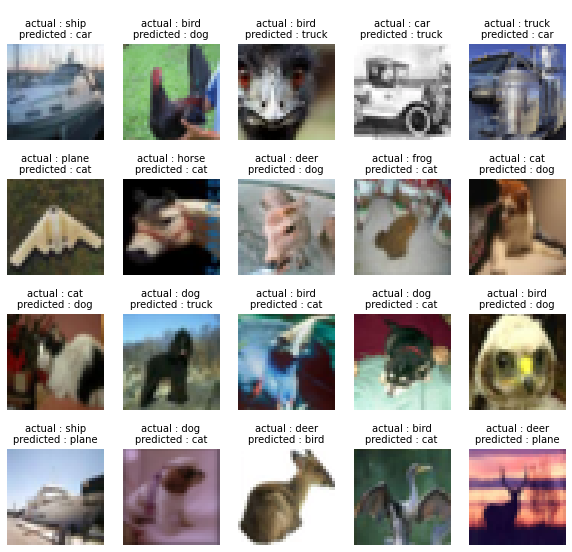

In [15]:
misclassified_images = trigger_training.wrong_predictions(model,test_loader)

## Plots for Validation Loss and Accuracy

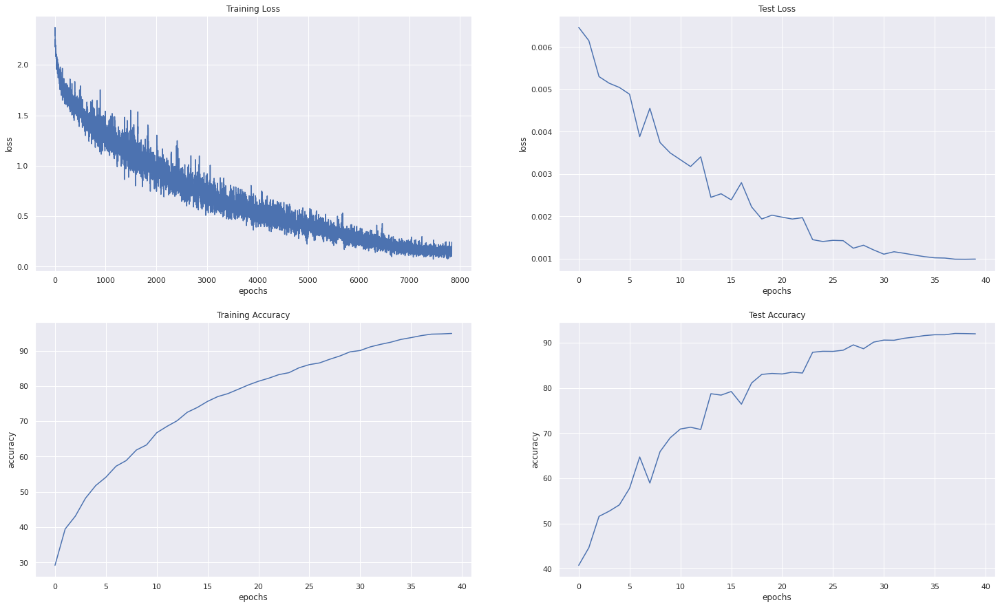

In [19]:
plot_metrics.plot_metrics(exp_metrics[experiment_name])

## Accuracy for each class

In [20]:
helper.class_level_accuracy(model, test_loader, device, classes)

Accuracy of plane : 92 %
Accuracy of   car : 97 %
Accuracy of  bird : 88 %
Accuracy of   cat : 82 %
Accuracy of  deer : 92 %
Accuracy of   dog : 87 %
Accuracy of  frog : 95 %
Accuracy of horse : 93 %
Accuracy of  ship : 95 %
Accuracy of truck : 95 %


## Plot Confusion Matrix

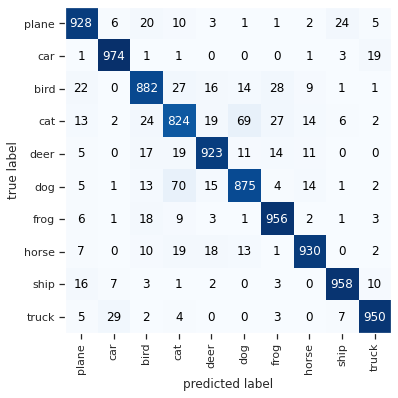

In [21]:
mat = helper.compute_confusion_matrix(model,test_loader,device)
plot_metrics.plot_confusion_matrix(mat, class_names=classes)


## Generate & Plot GradCam Images

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


torch.Size([10, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


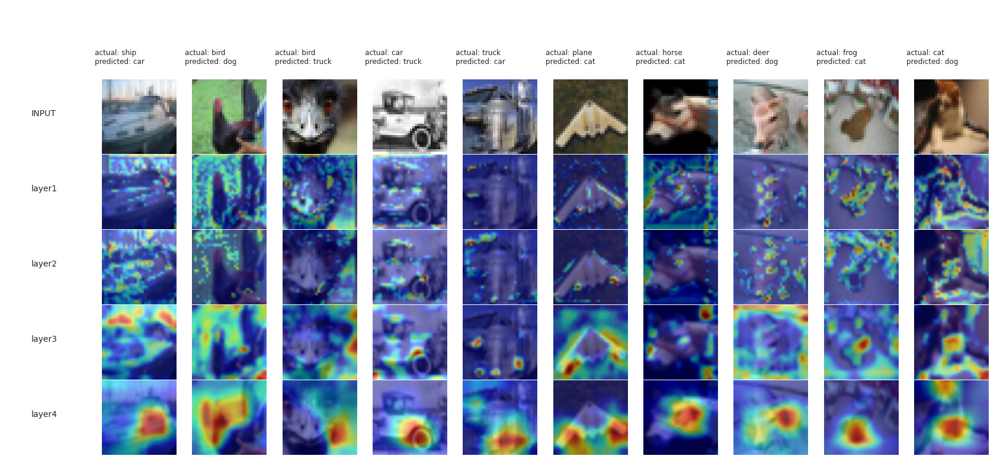

In [22]:
target_layers = ["layer1","layer2","layer3","layer4"]
gradcam_output, probs, predicted_classes = generate_gradcam(misclassified_images[:10], model, target_layers,device)
plot_gradcam(gradcam_output, target_layers, classes, (3, 32, 32),predicted_classes, misclassified_images[:10])

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


torch.Size([10, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


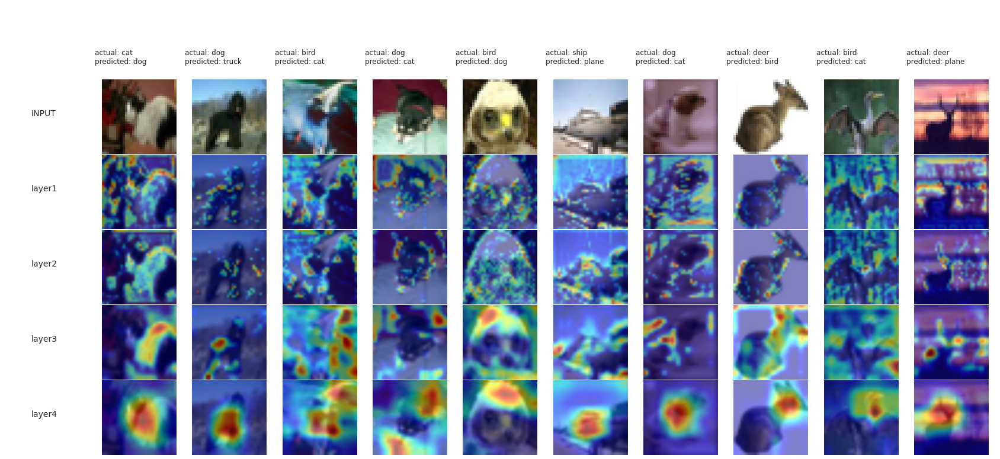

In [23]:
gradcam_output, probs, predicted_classes = generate_gradcam(misclassified_images[10:20], model, target_layers,device)
plot_gradcam(gradcam_output, target_layers, classes, (3, 32, 32),predicted_classes, misclassified_images[10:20])

In [24]:

%load_ext tensorboard
%tensorboard --logdir=runs

Output hidden; open in https://colab.research.google.com to view.